In [1]:
from deepface import DeepFace
from deepface.commons import functions
from deepface.basemodels import VGGFace, Facenet, OpenFace, FbDeepFace, ArcFace, Facenet512, DeepID, DlibWrapper
from deepface.basemodels import SFaceWrapper
from deepface.basemodels.DlibResNet import DlibResNet
from deepface.commons import functions, distance as dst

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.datasets import fetch_lfw_pairs

from tqdm.autonotebook import tqdm
from ast import literal_eval
import time

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import pathlib
import json
import copy
import shutil
import cv2
import os

from sklearn.datasets import fetch_lfw_people

## Load lfw people

In [2]:
res_folder = pathlib.Path("lfw_people_benchmark")

In [3]:
# load lfw people
lfw_people = fetch_lfw_people(resize=1, color=True)

In [4]:
X = lfw_people["images"] 
y = lfw_people["target"] 

# put X and y in a dataframe
df = pd.DataFrame({"img_rgb": list(X), "target": y})

In [5]:
df["img_bgr"] = df["img_rgb"].apply(lambda x: cv2.cvtColor(x, cv2.COLOR_RGB2BGR))

In [6]:
df["target"].value_counts()

1871    530
1047    236
5458    144
1404    121
1892    109
       ... 
4750      1
3352      1
3012      1
5025      1
2122      1
Name: target, Length: 5749, dtype: int64

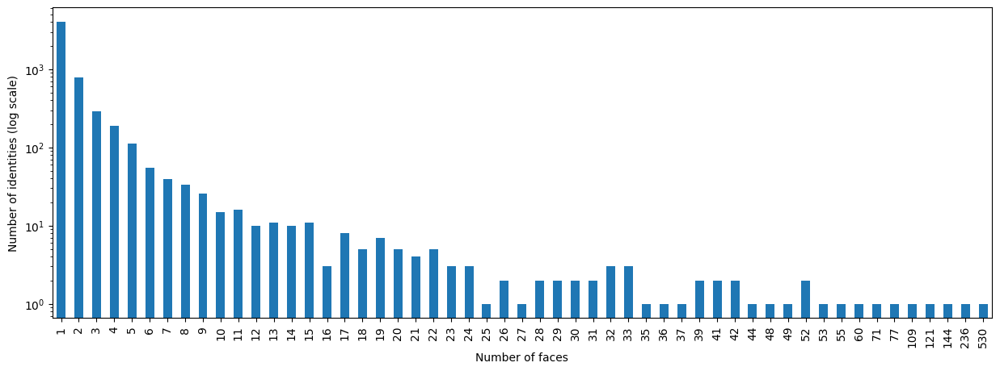

In [11]:
fig, ax = plt.subplots(figsize=(15, 5))

# use log scale for better visualization
ax.set_yscale("log")

df["target"].value_counts().value_counts().reset_index().sort_values(by = "index").plot.bar(x = "index", y = "target", ax=ax)
# xlabel
ax.set_xlabel("Number of faces")
# ylabel
ax.set_ylabel("Number of identities (log scale)")
# hide legend
ax.legend().set_visible(False)

# save as jpg
plt.savefig("lfw_people_histogram.png", dpi=300, bbox_inches='tight')

In [7]:
# exlude group with only 1 images
df = df.groupby("target").filter(lambda x: len(x) > 1)

Text(0, 0.5, 'number of faces')

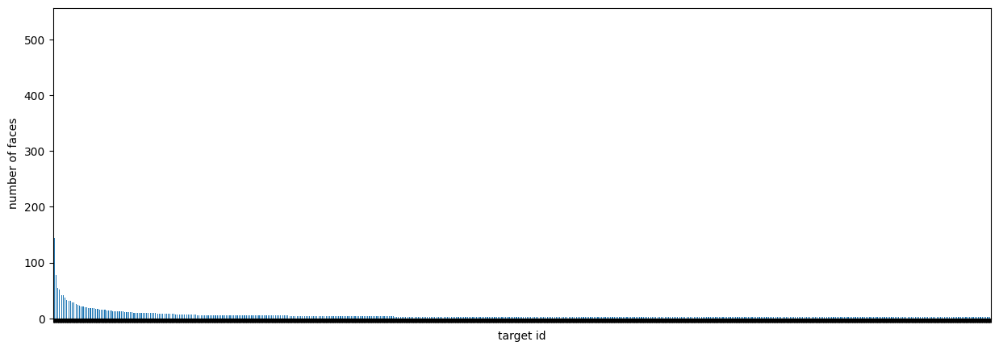

In [10]:
fig, ax = plt.subplots(figsize=(15, 5))
df["target"].value_counts().plot(kind="bar", ax=ax)
# remove xticks
ax.set_xticklabels([])
# x label 
ax.set_xlabel("target id")
# y label
ax.set_ylabel("number of faces")

In [21]:
# count number of target with 1 images
df["target"].value_counts()[df["target"].value_counts() == 1].shape

(4069,)

In [10]:
df["target"].value_counts()[df["target"].value_counts() != 1].shape

(1680,)

## Display samples of images

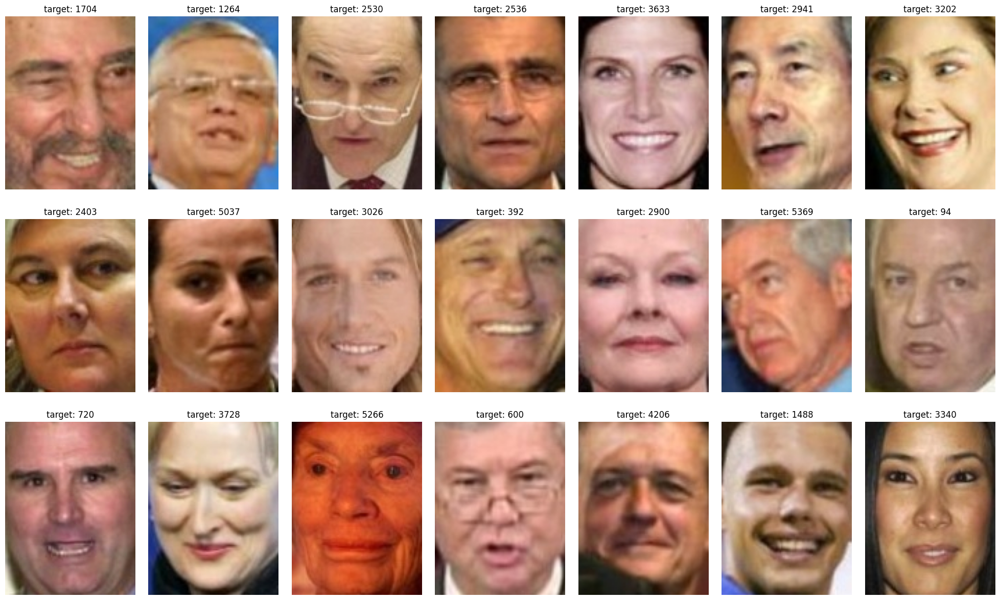

In [6]:
# display 3x5 random images
fig, axes = plt.subplots(3, 7, figsize=(25, 15))
fig.subplots_adjust(hspace=0.1, wspace=0.1)
for i, ax in enumerate(axes.flatten()):

    # get a random index
    idx = np.random.randint(0, len(df))

    # get the image and target
    img = df.iloc[idx]["img_rgb"]
    target = df.iloc[idx]["target"]

    # get img size
    height, width, channels = img.shape

    ax.imshow(img / 255)
    ax.set_title(f"target: {target}")

    ax.axis("off")

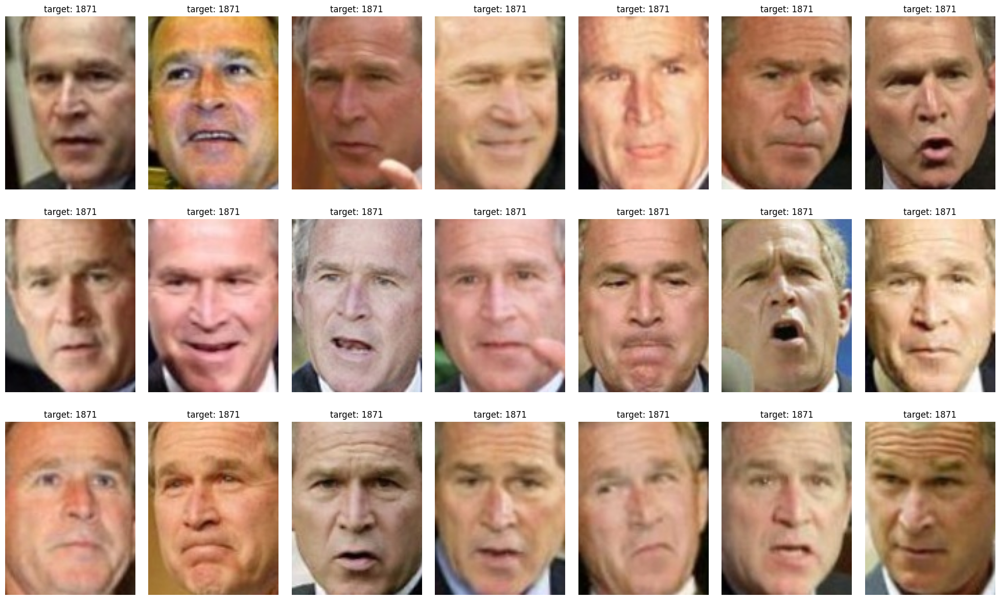

In [7]:
# display 3x5 images of the same person
fig, axes = plt.subplots(3, 7, figsize=(25, 15))
fig.subplots_adjust(hspace=0.1, wspace=0.1)

target = 1871
same_person = df[df["target"] == target]

for i, ax in enumerate(axes.flatten()):

    # get the image
    img = same_person.iloc[i]["img_rgb"]

    ax.imshow(img / 255)
    ax.set_title(f"target: {target}")

    ax.axis("off")

In [47]:
df["target"].value_counts()

1871    530
1047    236
5458    144
1404    121
1892    109
       ... 
4750      1
3352      1
3012      1
5025      1
2122      1
Name: target, Length: 5749, dtype: int64

## Representation of the data

In [6]:
models = {
  "SFace": SFaceWrapper.load_model,
  "Facenet": Facenet.loadModel,
  "Facenet512": Facenet512.loadModel,
  "VGG-Face": VGGFace.loadModel,
  "OpenFace": OpenFace.loadModel,
  "DeepFace": FbDeepFace.loadModel,
  "DeepID": DeepID.loadModel,
  "Dlib": DlibWrapper.loadModel,
  "ArcFace": ArcFace.loadModel,
}

In [24]:
# loop over models 
for model_name, model in tqdm(models.items()):

    print(f"model: {model_name}")

    # load model
    model = model()

    # create a folder for the model
    model_folder = res_folder / "representation" / model_name
    model_folder.mkdir(exist_ok=True, parents=True)

    # apply the model to the images
    df[f"{model_name}_representation"] = df["img_bgr"].apply(
    lambda x: DeepFace.represent(
        img_path=x, model_name=model_name, model=model, enforce_detection=False, detector_backend="skip"
        )
    )

    # save the dataframe (pickle)
    df[["img_rgb", "target", f"{model_name}_representation"]].to_pickle(model_folder / f"{model_name}_representations.pkl")

    # drop the representation column
    df.drop(columns=[f"{model_name}_representation"], inplace=True)
    
    break    

  0%|          | 0/9 [00:00<?, ?it/s]

model: SFace


## OPTICS / DBSCAN clustering testing

In [12]:
from sklearn.cluster import DBSCAN

In [54]:
models = [
    "SFace",
    "Facenet",
    "Facenet512",
    "VGG-Face",
    "OpenFace",
    "DeepFace",
    "DeepID",
    "Dlib",
    "ArcFace",
]

model_name = models[2]

# load lfw_people_benchmark/representation/Facenet512/Facenet512_representations.pkl
df_res = pd.read_pickle(f"lfw_people_benchmark/representation/{model_name}/{model_name}_representations.pkl")

X = np.array(df_res[f"{model_name}_representation"].to_list())

distance_metrics = [
    "cosine",
    "euclidean",
    "euclidean_l2",
]

metric = distance_metrics[0]

threshold = dst.findThreshold(model_name=model_name, distance_metric=metric)

clustering = DBSCAN(eps=threshold, min_samples=2, metric=metric)
clustering = clustering.fit(X)

5749 total identities

4069 identity with only 1 face --> outliers

1680 identity with 2 faces and more 

In [55]:
df_res["cluster_label"] = clustering.labels_
df_res["cluster_label"].value_counts()

 1      5710
-1      4002
 32      128
 56      103
 44       57
        ... 
 447       2
 445       2
 444       2
 443       2
 877       2
Name: cluster_label, Length: 879, dtype: int64

In [56]:
df_res["most_frequent_target"] = df_res.groupby("cluster_label")["target"].transform(lambda x: x.value_counts().index[0])

# check if the most frequent target is the same as the target
df_res["is_correct"] = df_res["target"] == df_res["most_frequent_target"]

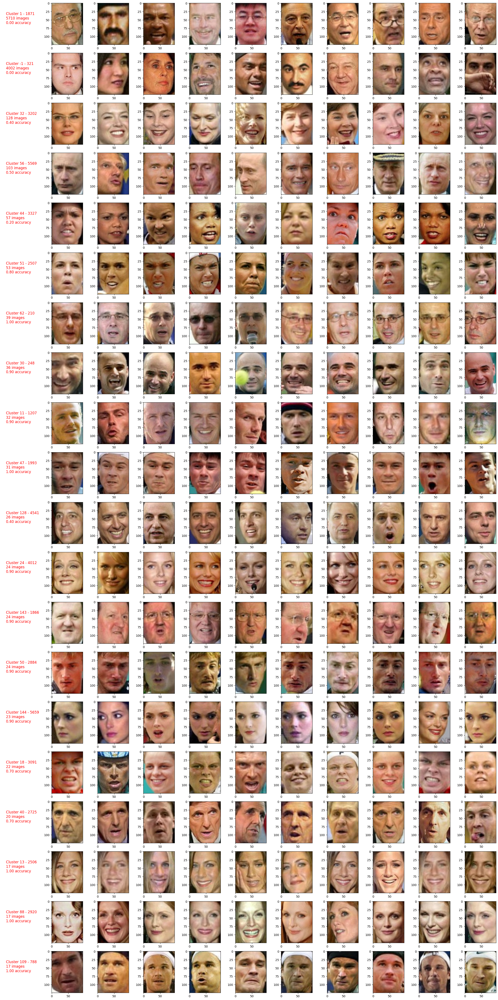

In [58]:
offset = 0
nb_cluster = 20
nb_cluster_end = nb_cluster - offset
cluster_name = df_res["cluster_label"].value_counts().index[offset:nb_cluster_end + offset]

fig, ax = plt.subplots(nb_cluster_end, 11, figsize=(30, nb_cluster_end*3))
for idx, i in enumerate(cluster_name):
    length = df_res[df_res["cluster_label"] == i].shape[0]
    cluster = df_res[df_res["cluster_label"] == i][:10]
    dominant_identity = cluster.iloc[0]["most_frequent_target"]
    accurary = cluster["is_correct"].mean()
    legend = f"Cluster {i} - {dominant_identity}\n{length} images\n{accurary:.2f} accuracy"
    ax[idx, 0].text(0.1, 0.5, legend, fontsize=12, color="red")
    ax[idx, 0].axis("off")
    for j, image in enumerate(cluster["img_rgb"]):
        ax[idx, j + 1].imshow(image / 255)
        # ax[idx, j].axis("off")
        # ax[idx, j].set_title(img_path)
        # break
    # break

In [66]:
df_temps = df_res[(df_res["cluster_label"] != -1)]
print(df_temps["is_correct"].mean())
df_temps = df_temps[(df_temps["cluster_label"] != 1)]
print(df_temps["is_correct"].mean())

0.3754739464846712
0.8341380289690429


## Agglomerative clustering

In [1]:
from sklearn.cluster import AgglomerativeClustering
# https://scikit-learn.org/stable/modules/clustering.html#hierarchical-clustering

In [2]:
models = [
    "SFace",
    "Facenet",
    "Facenet512",
    "VGG-Face",
    "OpenFace",
    "DeepFace",
    "DeepID",
    "Dlib",
    "ArcFace",
]

model_name = models[2]

In [5]:
# load lfw_people_benchmark/representation/Facenet512/Facenet512_representations.pkl
df_res = pd.read_pickle(f"lfw_people_benchmark/representation/{model_name}/{model_name}_representations.pkl")

In [6]:
distance_metrics = [
    "cosine",
    "euclidean",
    "euclidean_l2",
]

threshold = dst.findThreshold(model_name=model_name, distance_metric=distance_metrics[0])
threshold

0.3

In [7]:
affinity = "cosine"
linkage = "average"

clustering = AgglomerativeClustering(distance_threshold=threshold, affinity=affinity, linkage=linkage, n_clusters=None)

X = np.array(df_res[f"{model_name}_representation"].to_list())
print(X.shape)

res = clustering.fit(X)
df_res["cluster_label"] = res.labels_

(13233, 512)
6957


In [9]:
print(df_res["cluster_label"].nunique())

6957


In [10]:
df_res["cluster_label"].value_counts()

239     442
515     234
82      101
104      97
427      87
       ... 
4430      1
6840      1
6842      1
4791      1
2078      1
Name: cluster_label, Length: 6957, dtype: int64

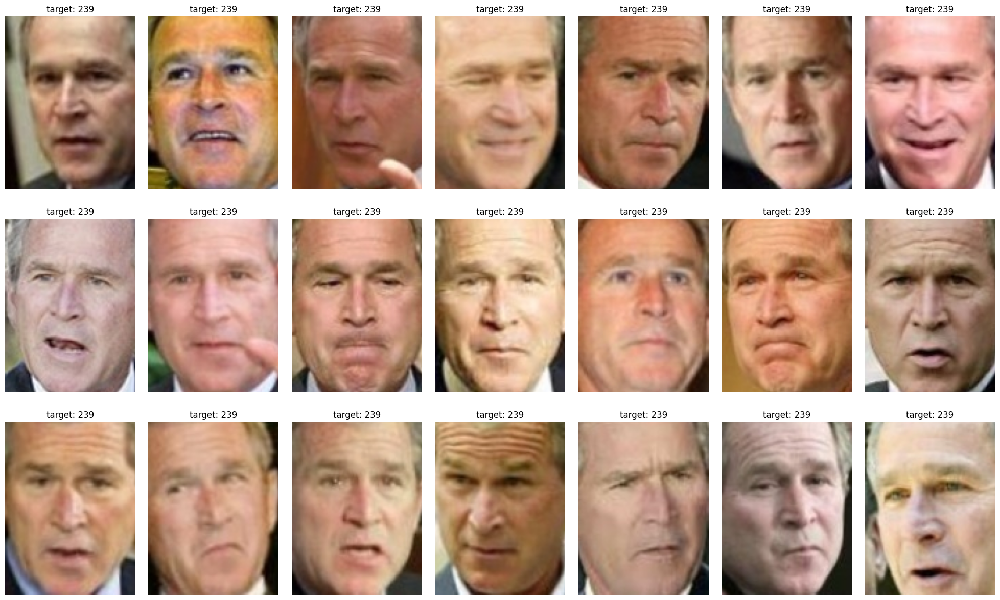

In [11]:
# display 3x5 images of the same person
fig, axes = plt.subplots(3, 7, figsize=(25, 15))
fig.subplots_adjust(hspace=0.1, wspace=0.1)

target = 239
same_person = df_res[df_res["cluster_label"] == target]

for i, ax in enumerate(axes.flatten()):

    # get the image
    img = same_person.iloc[i]["img_rgb"]

    ax.imshow(img / 255)
    ax.set_title(f"target: {target}")

    ax.axis("off")

## evaluate the clustering

In [26]:
expected_nb_cluster = df_res["target"].nunique()
assert expected_nb_cluster == 5749 # 5749 unique people in the dataset
print(f"Expected number of clusters: {expected_nb_cluster}")

Expected number of clusters: 5749


In [28]:
# ignore the outliers for the evaluation
# df_res = df_res[df_res["cluster_label"] != -1]

#### nb of clusters

In [29]:
nb_clusters_predicted = df_res["cluster_label"].nunique()
nb_clusters_predicted

878

#### average number of different people per cluster

In [30]:
# for each group, count the number of unique targets
df_stats = df_res.groupby("cluster_label").agg(
    {
        "target": ["nunique", "count"],
    }
).reset_index()

df_stats.columns = ["_".join(col) for col in df_stats.columns]

In [31]:
people_per_cluster_wmean = (df_stats["target_nunique"] * (df_stats["target_count"] / df_stats["target_count"].sum())).sum()
people_per_cluster_wmean

883.1687791138553

In [32]:
people_per_cluster_mean = df_stats["target_nunique"].mean()
people_per_cluster_mean

3.0444191343963554

#### "correctly" clustered people

In [33]:
# for each group get the most frequent target
df_res["most_frequent_target"] = df_res.groupby("cluster_label")["target"].transform(lambda x: x.value_counts().index[0])

# check if the most frequent target is the same as the target
df_res["is_correct"] = df_res["target"] == df_res["most_frequent_target"]

# get the accuracy
correctly_clustered_mean = df_res["is_correct"].mean()
correctly_clustered_mean

0.3754739464846712

#### average number of cluster per identity

In [34]:
df_most = df_res.groupby("cluster_label")["target"].agg(lambda x: x.value_counts().index[0]).reset_index()
identity_per_cluster_mean = df_most["target"].value_counts().mean()
# identity_per_cluster_std = df_most["target"].value_counts().std()
identity_per_cluster_max = df_most["target"].value_counts().max()
identity_per_cluster_mean, identity_per_cluster_max

(1.0329411764705883, 3)

#### Number of non-represented identity

In [35]:
# number of detected (dominant) identities
df_most["target"].nunique()

850

In [36]:
nb_missing_identities = df_res["target"].nunique() - df_most["target"].nunique()
nb_missing_identities

1751

#### nb of clusters with only one identity

In [37]:
nb_clusters_with_only_one_identity = (df_most["target"].value_counts() == 1).sum()
nb_clusters_with_only_one_identity

825

#### summary

In [38]:
res = {
    "model_name": model_name,
    "affinity": affinity,
    "threshold": threshold,
    "linkage": linkage,
    "nb_clusters_predicted": nb_clusters_predicted,
    "people_per_cluster_wmean": people_per_cluster_wmean,
    "people_per_cluster_mean": people_per_cluster_mean,
    "correctly_clustered_mean": correctly_clustered_mean,
    "identity_per_cluster_mean": identity_per_cluster_mean,
    # "identity_per_cluster_std": identity_per_cluster_std,
    "nb_missing_identities": nb_missing_identities,
    "nb_clusters_with_only_one_identity": nb_clusters_with_only_one_identity,
}

res

NameError: name 'affinity' is not defined

In [148]:
# transform res to a dataframe
df_tosave = pd.DataFrame(res, index=[0])

In [151]:
# check if the file already exists
save_path = "lfw_people_benchmark/results/results.csv"
if os.path.isfile(save_path):
    df_results = pd.read_csv(save_path)
    df_results = pd.concat([df_results, df_tosave])
else:
    df_results = df_tosave

# save the results
df_results.to_csv(save_path, index=False)

### expected results

In [13]:
df_res["target"].nunique()

5749

In [14]:
df_res["target"].value_counts()

1871    530
1047    236
5458    144
1404    121
1892    109
       ... 
4750      1
3352      1
3012      1
5025      1
2122      1
Name: target, Length: 5749, dtype: int64

# results

In [1]:
import pandas as pd

In [2]:
models = [
    "SFace",
    "Facenet",
    "Facenet512",
    "VGG-Face",
    "OpenFace",
    "DeepFace",
    "DeepID",
    "Dlib",
    "ArcFace",
]

In [3]:
# loop over all model and add the results to a dataframe
df_results = pd.DataFrame()
for model in models:
    df = pd.read_csv(f"lfw_people_benchmark/results/{model}_results.csv")
    df["model"] = model
    df_results = pd.concat([df_results, df])

In [4]:
df_results["nb_clusters_ratio"] = df_results["nb_clusters_predicted"] / 5749
df_results["nb_clusters_ratio_abs"] = (df_results["nb_clusters_ratio"] - 1).abs()

In [7]:
# sort df_results by correctly_clustered_mean
df_results.sort_values("correctly_clustered_mean", ascending=False)

,model_name,affinity,threshold,linkage,nb_clusters_predicted,people_per_cluster_wmean,people_per_cluster_mean,correctly_clustered_mean,nb_identities,model,nb_clusters_ratio,nb_clusters_ratio_abs
0,Facenet512,cosine,0.30,complete,7598,1.091891,1.070940,0.959268,5343,Facenet512,1.321621,0.321621
1,Facenet512,cosine,0.30,average,6957,1.129374,1.082363,0.956170,5308,Facenet512,1.210123,0.210123
3,Facenet,euclidean,10.00,ward,7119,1.295096,1.184296,0.900627,4935,Facenet,1.238302,0.238302
4,Facenet,euclidean,10.00,complete,6830,1.388196,1.200000,0.896018,4891,Facenet,1.188033,0.188033
5,Facenet,euclidean,10.00,average,6037,3.272652,1.252278,0.879392,4756,Facenet,1.050096,0.050096
...,...,...,...,...,...,...,...,...,...,...,...,...
6,Facenet512,euclidean,23.56,single,23,5720.042696,250.130435,0.041714,23,Facenet512,0.004001,0.995999
6,VGG-Face,euclidean,0.60,single,22,5723.903650,261.545455,0.041638,22,VGG-Face,0.003827,0.996173
2,ArcFace,cosine,0.68,single,2,5747.565707,2874.500000,0.040127,2,ArcFace,0.000348,0.999652
2,VGG-Face,cosine,0.40,single,1,5749.000000,5749.000000,0.040051,1,VGG-Face,0.000174,0.999826
